In [81]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from PIL import ImageFilter
from PIL import ImageChops
from PIL import ImageOps
from PIL import ImageStat as stat

In [82]:
def statystyki(im):
    print("tryb obrazu", im.mode)
    print("rozmiar obrazu", im.size)
    s = stat.Stat(im)
    print("extrema ", s.extrema)  # max i min
    print("count ", s.count)  # zlicza
    print("mean ", s.mean)  # srednia
    print("median ", s.median)  # mediana
    print("stddev ", s.stddev)  # odchylenie standardowe

def statystyki_z_maska(im, maska):
    print("tryb obrazu", im.mode,  "tryb maski",  maska.mode)
    print("rozmiar obrazu", im.size, "rozmiar maski", maska.size)
    s = stat.Stat(im, mask = maska)
    print("extrema ", s.extrema)  # max i min
    print("count ", s.count)  # zlicza
    print("mean ", s.mean)  # srednia
    print("median ", s.median)  # mediana
    print("stddev ", s.stddev)  # odchylenie standardowe

(212, 259) RGB


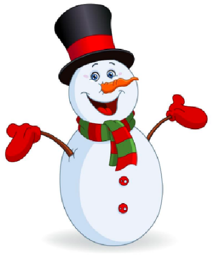

In [83]:
im_b = Image.open('balwan1.png')
print(im_b.size, im_b.mode)
im_b

Zmiana wielkosci obrazu

Image.resize(size, resample=None, box=None, reducing_gap=None)
resample – An optional resampling filter:
    Image.NEAREST (0), Image.LANCZOS (1), Image.BILINEAR (2), 
    Image.BICUBIC (3), Image.BOX (4) or Image.HAMMING (5)   

(424, 519) RGB


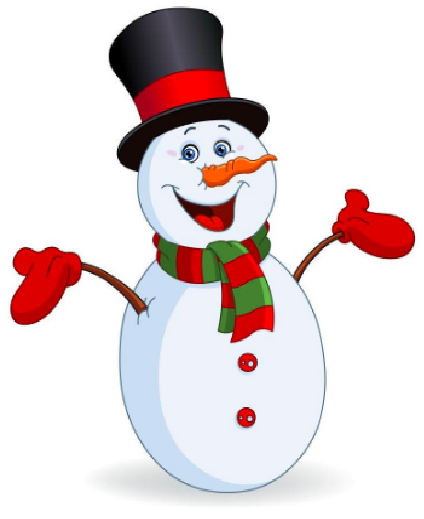

In [84]:
im = Image.open('balwan.png')
print(im.size, im.mode)
im

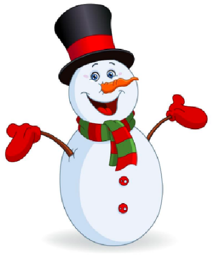

In [85]:
w,h = im.size
s_w = 0.5 # skala zmiany rozmiaru w 
s_h = 0.5 # skala zmiany rozmiaru h
w0 = int(w*s_w)
h0 = int(h*s_h)
im1 = im.resize((w0,h0), 3, reducing_gap = None) # domyśna metoda NEAREST
im1

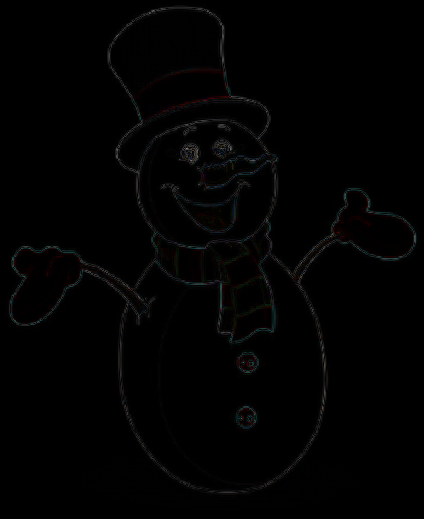

In [86]:
im2 = im1.resize((w,h), 3, reducing_gap = None)# domyśna metoda NEAREST
ImageChops.difference(im,im2)

wycinanie z jednoczesną zmianą rozmiaru wycinka

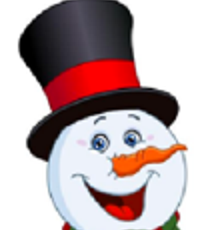

In [87]:
w_p = 45
h_p = 5
w_k = 150
h_k = 120
wycinek = (w_p, h_p, w_k, h_k) # definicja miejsca wycięcia w_p, h_p - lewy górny róg, w_k,h_k prawy dolny róg
wyc_w = wycinek[2] - wycinek[0] # szerokość wycinka
wyc_h = wycinek[3] - wycinek[1] # wysokość wycinka
s_w = 2 # skala dla szerokości
s_h = 2 # skala dla wysokości
glowa = im1.resize((s_w * wyc_w, s_h * wyc_h) , box = wycinek) # wycina wycinek i zmienia rozmiar wycinka
glowa

# image.rotate(angle, resample=0, expand=0, center=None, translate=None, fillcolor=None)

In [88]:
# image.rotate(angle, resample=0, expand=0, center=None, translate=None, fillcolor=None)
# angle: It is the angle in degrees counterclockwise.
# resample: It is an optional input. It can be one of PIL.Image.NEAREST (use the nearest neighbor), PIL.Image.BILINEAR (linear interpolation in a 2×2 environment), or PIL.Image.BICUBIC (cubic spline interpolation in a 4×4 environment). If omitted, or if the image has mode “1” or “P,” it is set PIL.Image.NEAREST. See Filters.
# expand: It is an optional input. If set to True, the images expand and become large enough to hold the entire rotated image. If set to False, the output image is of the same size as of input image.
# center: It is an optional input. It set the center of image rotation. By default, it is the center of the image.
# translate: It is an optional input. It is a post-rotate translation.
# fillcolor: It is an optional input. It is a color for an area outside the rotated image.

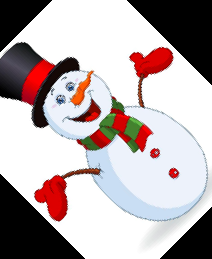

In [89]:
rot_45 = im1.rotate(45) # obrót o 45 stopni w lewo
rot_315 = im1.rotate(315) # obrót o 45 stopni w prawo = # obrót o 315 stopni w lewo
rot_45

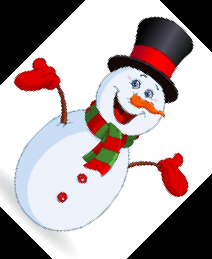

In [90]:
rot_315

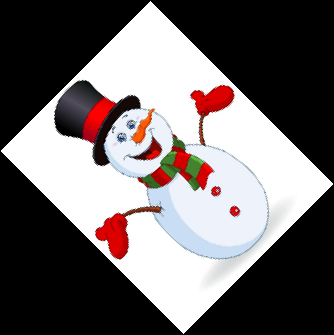

In [91]:
rot_45_exp = im1.rotate(45, expand=1) # obrót o 45 stopni w lewo, rozszerzony (expand = 1) tek, zeby po obrocie widac było cały obraz
rot_45_exp

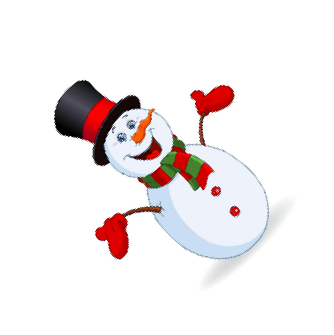

In [92]:
rot_45_exp_fill = im1.rotate(45, expand=1, fillcolor=(255,255,255)) # obrót o 45 stopni w lewo, rozszerzony (expand = 1) tek, zeby po obrocie widac było cały obraz
# dodatkowe obszary, które musza powstac po obrocie zostały wypełnione kolorem białym
rot_45_exp_fill

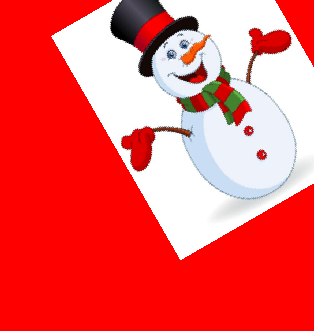

In [93]:
# obrót wokół punktu center domyslnie jest to obrót wokół srodka obrazu
rot_center = im1.rotate(30, expand=1, fillcolor=(255,0,0), center=(0,0)) # expand nie działa dobrze, gdy center nie jest środkiem obrazu
rot_center


# inne przekształcenia geometryczne
im.transpose(Image.FLIP_LEFT_RIGHT) \
im.transpose(Image.FLIP_TOP_BOTTOM) \
im.transpose(Image.TRANSPOSE) \
im.transpose(Image.TRANSVERSE)  

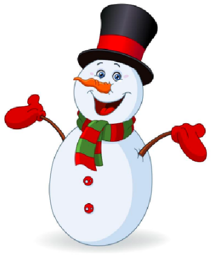

In [94]:
t1 = im1.transpose(Image.FLIP_LEFT_RIGHT)
t1


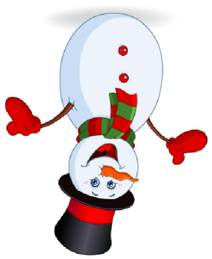

In [95]:
t2 = im1.transpose(Image.FLIP_TOP_BOTTOM)
t2




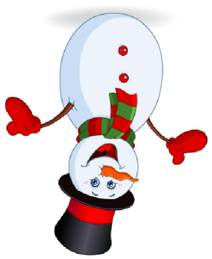

In [96]:
o1 = im1.rotate(180)
t2_1 = o1.transpose(Image.FLIP_LEFT_RIGHT)
t2_1
# o1


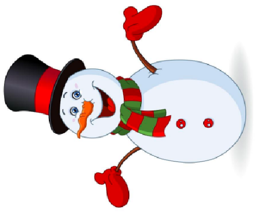

In [97]:
t3 = im1.transpose(Image.TRANSPOSE)
t3



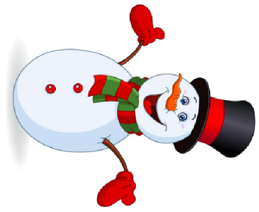

In [98]:
im1.transpose(Image.TRANSVERSE)

wycinanie fragmentu obrazu - Image.crop(box), gdzie box jest czwórką liczb

In [99]:
guzik_box = (118, 177, 130, 189)
guzik = im_b.crop(guzik_box)
guzik


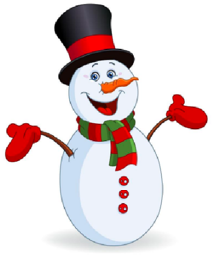

In [100]:
im1 = im_b.copy()
im1.paste(guzik, (118,190)) # paste - argumenty: obraz wklejany, miejsce wklejenia, ewentualnie maska
im1

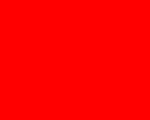

In [101]:
new = Image.new('RGB', (150, 120), im1.getpixel((100,40))) # tworzy nowy obraz, argumenty: tryb, wymiary obrazu, kolor
new

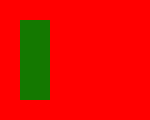

In [102]:
new.paste((20,120,0), (20, 20, 50, 100)) # koloorujemy box (20, 20, 50, 100) na kolor (20,120,0)
new

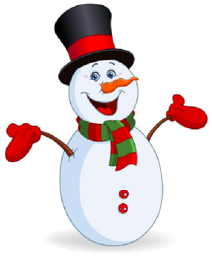

In [103]:
#usun guzik bałwankowi

im2 = im1.copy()
new1 = Image.new('RGB', (guzik_box[2]-guzik_box[0], guzik_box[3]-guzik_box[1]), im2.getpixel((150,160))) # tworzy nowy obraz, argumenty: tryb, wymiary obrazu, kolor
im2.paste(new1, (118,174))
im2

Zastosowane paste i crop , tworzenie maski, wklejanie z maską

im.paste(im1, box, mask), gdzie 
 im - obraz, do którego wklejamy
 im1 - obraz wklejany
 box - para liczb (położenie lewego górnego rogu wklejanego obrazu) 
lub box w postaci czwórki - wtedy box musi pokrywac sie z obrazem wklejanym
 mask - maska (obraz w trybie “1”, “L”, “LA”, “RGBA” )

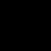

In [104]:
new2 = Image.new('L', (51, 51), 0)
new2

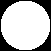

In [105]:
def zakres(w, h):  
    return [(i, j) for i in range(w) for j in range(h)]

def rysuj_kolo(obraz, m_s, n_s, r, kolor):
    obraz1 = obraz.copy()
    w, h = obraz.size
    for i, j in zakres(w, h):
        if (i-m_s)**2+(j-n_s)**2 < r**2: # wzór na koło o środku (m_s, n_s) i promieniu r
            obraz1.putpixel((i,j), kolor)
    return obraz1

maska = rysuj_kolo(new2, 25, 25, 25, 255)
maska

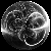

In [106]:
maska1 = Image.open('maska1.png')
maska1 = maska1.resize(maska.size)

new2.paste(maska1, mask = maska)
maska_L = new2.copy()
maska_L

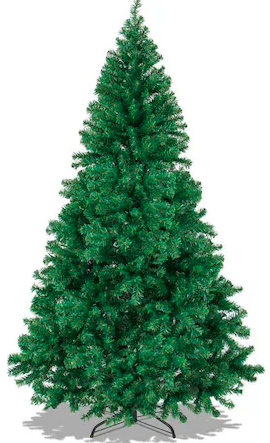

In [107]:
choinka =  Image.open('choinka.png')
choinka

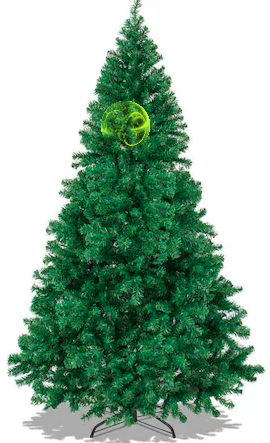

In [108]:
kolorowe_tlo = Image.open("kolorowe_tlo.png")
wycinek = kolorowe_tlo.crop((50,50,101,101))
choinka.paste(wycinek, (100,100), mask = maska_L)
choinka

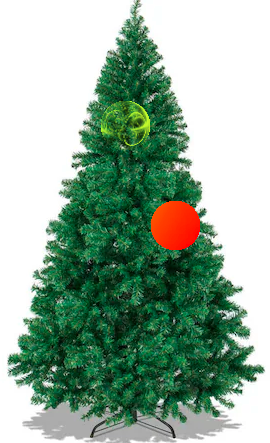

In [109]:
wycinek = kolorowe_tlo.crop((180,100,231,151))
choinka.paste(wycinek, (150,200), mask = maska)
choinka

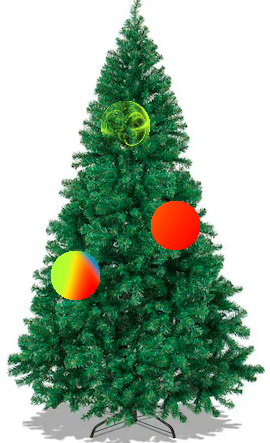

In [110]:
kt1 = kolorowe_tlo.resize(maska.size)
choinka.paste(kt1, (50,250), mask = maska)
choinka

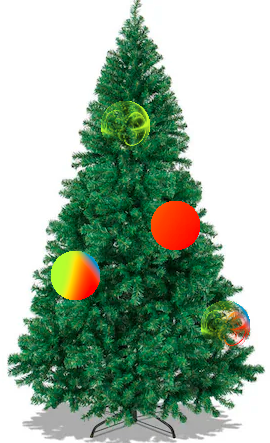

In [111]:
choinka.paste(kt1, (200,300), mask = new2)
choinka

staystyki z maską

In [112]:
wyc = choinka.crop((40,300, 80, 340))
statystyki(wyc)
tlo = Image.new('L', choinka.size, 0)
maska_czarne = Image.new('L', wyc.size, 255)
tlo.paste(maska_czarne,  (40,300))
print('------------------------------')
statystyki_z_maska(choinka, tlo)
# tlo


tryb obrazu RGB
rozmiar obrazu (40, 40)
extrema  [(0, 182), (6, 228), (0, 198)]
count  [1600, 1600, 1600]
mean  [23.28375, 96.03125, 55.280625]
median  [14, 96, 52]
stddev  [28.80864863087993, 31.94930004612777, 27.692338734916824]
------------------------------
tryb obrazu RGB tryb maski L
rozmiar obrazu (270, 443) rozmiar maski (270, 443)
extrema  [(0, 182), (6, 228), (0, 198)]
count  [1600, 1600, 1600]
mean  [23.28375, 96.03125, 55.280625]
median  [14, 96, 52]
stddev  [28.80864863087993, 31.94930004612777, 27.692338734916824]


Zastosowane paste i crop  - przewijanie obrazu z lewej na prawo

In [113]:
def roll(image, delta): 
    xsize, ysize = image.size
    delta = delta % xsize
    if delta == 0: return image
    part1 = image.crop((0, 0, delta, ysize))
    part2 = image.crop((delta, 0, xsize, ysize))
    image.paste(part1, (xsize - delta, 0, xsize, ysize))
    image.paste(part2, (0, 0, xsize - delta, ysize))
    return image

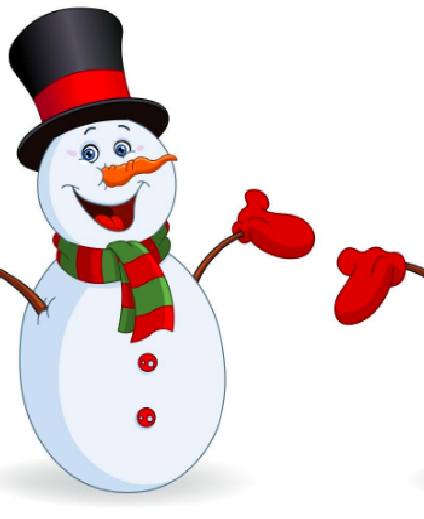

In [114]:
roll(im, 100)

1. Zastosuj metode resize do obrazu postac. Utwórz 6 obrazów przyjmując skalę dla szerokości s_w = 0.15, skalę dla wysokości s_h = 0.27 oraz kolejno metody resamplingu 'NEAREST','LANCZOS','BILINEAR','BICUBIC','BOX','HAMMING' Przedstaw na jednym diagramie plt (fig1.png) obrazy po przeskalowaniu i ich różnice w stosunku do NEAREST. Pobierz statystyki różnic i skomentuj.

Statystyki dla różnicy obrazów NEAREST i NEAREST:
tryb obrazu RGB
rozmiar obrazu (120, 216)
extrema  [(0, 0), (0, 0), (0, 0)]
count  [25920, 25920, 25920]
mean  [0.0, 0.0, 0.0]
median  [0, 0, 0]
stddev  [0.0, 0.0, 0.0]
Statystyki dla różnicy obrazów NEAREST i LANCZOS:
tryb obrazu RGB
rozmiar obrazu (120, 216)
extrema  [(0, 103), (0, 103), (0, 96)]
count  [25920, 25920, 25920]
mean  [2.9330246913580247, 2.7856095679012345, 2.8123456790123456]
median  [1, 1, 1]
stddev  [5.997773927534289, 5.750247016865465, 5.756609356896942]
Statystyki dla różnicy obrazów NEAREST i BILINEAR:
tryb obrazu RGB
rozmiar obrazu (120, 216)
extrema  [(0, 109), (0, 107), (0, 100)]
count  [25920, 25920, 25920]
mean  [3.164699074074074, 2.95991512345679, 2.995679012345679]
median  [1, 1, 1]
stddev  [6.493235736218904, 6.1483378506820285, 6.1847255472250176]
Statystyki dla różnicy obrazów NEAREST i BICUBIC:
tryb obrazu RGB
rozmiar obrazu (120, 216)
extrema  [(0, 104), (0, 103), (0, 96)]
count  [25920, 25920, 25920]

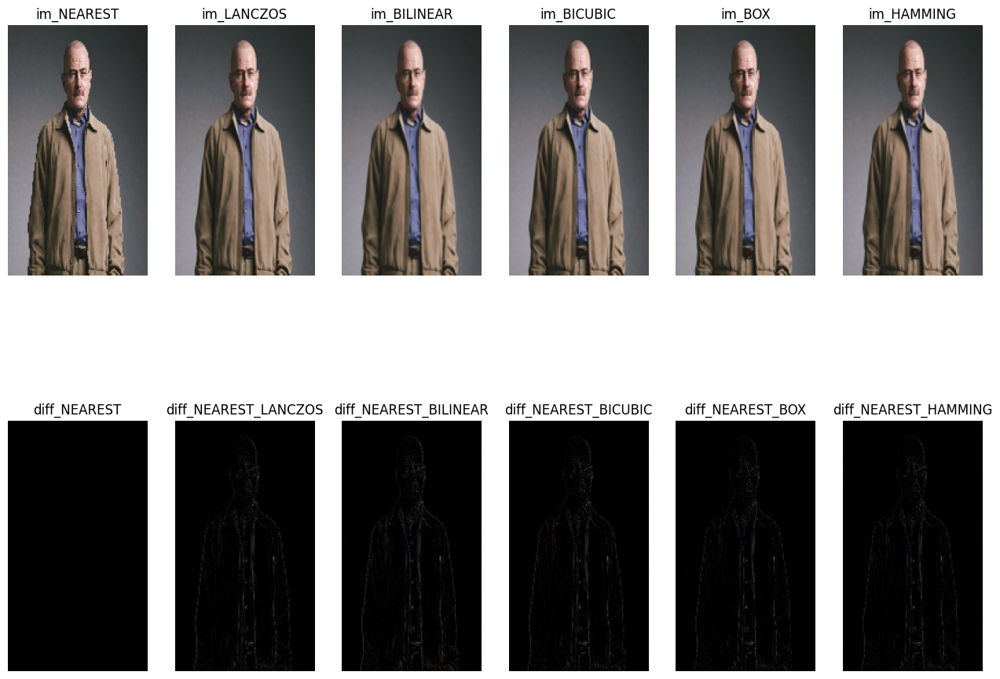

In [115]:
im = Image.open("postac.jpg")
s_w = 0.15
s_h = 0.27
w, h = im.size
w0 = int(w * s_w)
h0 = int(h * s_h)

im_NEAREST = im.resize((w0, h0), resample=0, reducing_gap=None)
diff_NEAREST = ImageChops.difference(im_NEAREST, im_NEAREST)
print("Statystyki dla różnicy obrazów NEAREST i NEAREST:")
stat_diff_NEAREST = statystyki(diff_NEAREST)
im_LANCZOS = im.resize((w0, h0), resample=1, reducing_gap=None)
diff_NEAREST_LANCZOS = ImageChops.difference(im_NEAREST, im_LANCZOS)
print("Statystyki dla różnicy obrazów NEAREST i LANCZOS:")
stat_diff_NEAREST_LANCZOS = statystyki(diff_NEAREST_LANCZOS)
im_BILINEAR = im.resize((w0, h0), resample=2, reducing_gap=None)
diff_NEAREST_BILINEAR = ImageChops.difference(im_NEAREST, im_BILINEAR)
print("Statystyki dla różnicy obrazów NEAREST i BILINEAR:")
stat_diff_NEAREST_BILINEAR = statystyki(diff_NEAREST_BILINEAR)
im_BICUBIC = im.resize((w0, h0), resample=3, reducing_gap=None)
diff_NEAREST_BICUBIC = ImageChops.difference(im_NEAREST, im_BICUBIC)
print("Statystyki dla różnicy obrazów NEAREST i BICUBIC:")
stat_diff_NEAREST_BICUBIC = statystyki(diff_NEAREST_BICUBIC)
im_BOX = im.resize((w0, h0), resample=4, reducing_gap=None)
diff_NEAREST_BOX = ImageChops.difference(im_NEAREST, im_BOX)
print("Statystyki dla różnicy obrazów NEAREST i BOX:")
stat_diff_NEAREST_BOX = statystyki(diff_NEAREST_BOX)
im_HAMMING = im.resize((w0, h0), resample=5, reducing_gap=None)
diff_NEAREST_HAMMING = ImageChops.difference(im_NEAREST, im_HAMMING)
print("Statystyki dla różnicy obrazów NEAREST i HAMMING:")
stat_diff_NEAREST_HAMMING = statystyki(diff_NEAREST_HAMMING)


plt.figure(figsize=(16, 12))
plt.subplot(2, 6, 1)
plt.title("im_NEAREST")
plt.imshow(im_NEAREST)
plt.axis("off")
plt.subplot(2, 6, 7)
plt.title("diff_NEAREST")
plt.imshow(diff_NEAREST)
plt.axis("off")
plt.subplot(2, 6, 2)
plt.title("im_LANCZOS")
plt.imshow(im_LANCZOS)
plt.axis("off")
plt.subplot(2, 6, 8)
plt.title("diff_NEAREST_LANCZOS")
plt.imshow(diff_NEAREST_LANCZOS)
plt.axis("off")
plt.subplot(2, 6, 3)
plt.title("im_BILINEAR")
plt.imshow(im_BILINEAR)
plt.axis("off")
plt.subplot(2, 6, 9)
plt.title("diff_NEAREST_BILINEAR")
plt.imshow(diff_NEAREST_BILINEAR)
plt.axis("off")
plt.subplot(2, 6, 4)
plt.title("im_BICUBIC")
plt.imshow(im_BICUBIC)
plt.axis("off")
plt.subplot(2, 6, 10)
plt.title("diff_NEAREST_BICUBIC")
plt.imshow(diff_NEAREST_BICUBIC)
plt.axis("off")
plt.subplot(2, 6, 5)
plt.title("im_BOX")
plt.imshow(im_BOX)
plt.axis("off")
plt.subplot(2, 6, 11)
plt.title("diff_NEAREST_BOX")
plt.imshow(diff_NEAREST_BOX)
plt.axis("off")
plt.subplot(2, 6, 6)
plt.title("im_HAMMING")
plt.imshow(im_HAMMING)
plt.axis("off")
plt.subplot(2, 6, 12)
plt.title("diff_NEAREST_HAMMING")
plt.imshow(diff_NEAREST_HAMMING)
plt.axis("off")
plt.show()

BOX / BILINEAR / HAMMING: Wykazują mniejsze różnice niż inne metody, ponieważ ich algorytmy są mniej agresywne w wygładzaniu krawędzi.

LANCZOS / BICUBIC: Generują największe różnice względem NEAREST. Wynika to z faktu, że algorytmy te stosują zaawansowaną interpolację, która wygładza krawędzie (antyaliasing), podczas gdy NEAREST pozostawia ostre, schodkowane piksele.

2. Porównaj dwa obrazy (statystyki różnicy) otrzymane w następujący sposób:
    a. Stosując metodę resize z wybraną metodą resamplingu powiększ fragment obraz postac przedstawiający głowę dwukrotnie na szerokość i trzykrotnie na wysokość
    b. Stosując metodę crop wytnij ten sam fragment obrazu postac i otrzymany obraz powiększ dwukrotnie z tą samą metodą resmplingu na szerokość i trzykrotnie na wysokość.

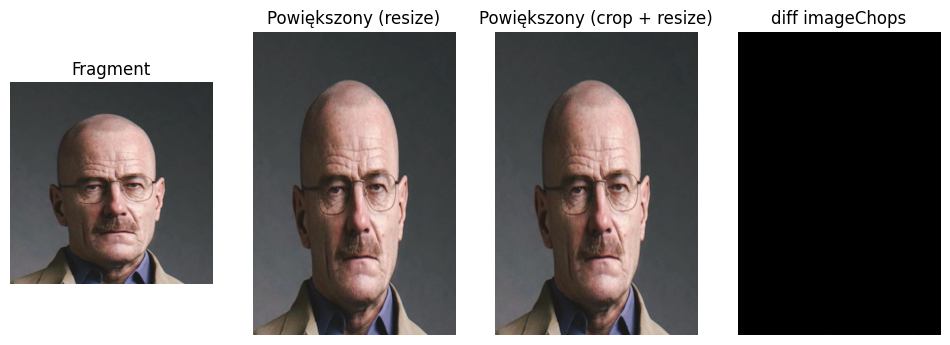

In [116]:
glowa = (250, 0, 550, 300)
glowa_crop = im.crop((250, 0, 550, 300))
w, h = glowa_crop.size
new_w = w * 2
new_h = h * 3
glowa_crop_resize = im.crop((glowa)).resize(
    (new_w, new_h), resample=Image.Resampling.LANCZOS)
glowa_crop_resize.save('glowa_crop_resize.png')
glowa_resize = im.resize(
    (new_w, new_h), resample=Image.Resampling.LANCZOS, box=glowa)
glowa_resize.save('glowa_resize.png')
diff_resize = ImageChops.difference(glowa_crop_resize, glowa_resize)
diff_resize.save('diff_resize.png')


plt.figure(figsize=(12, 6))
plt.subplot(1, 4, 1)
plt.title("Fragment")
plt.imshow(glowa_crop)
plt.axis("off")
plt.subplot(1, 4, 2)
plt.title("Powiększony (resize)")
plt.imshow(glowa_resize)
plt.axis("off")
plt.subplot(1, 4, 3)
plt.title("Powiększony (crop + resize)")
plt.imshow(glowa_crop_resize)
plt.axis("off")
plt.subplot(1, 4, 4)
plt.title("diff imageChops")
plt.imshow(diff_resize)
plt.axis("off")
plt.show()

3. Obróć obraz\
    a. o 60 stopni w lewo dobierając argumenty metody rotate tak, żeby widoczny był cały obraz postac, a nadmiarowy fragment był w kolorze czerwonym\
    b. o 60 stopni w prawo dobierając argumenty metody rotate tak, żeby rozmiar obrazu postac się nie zmienił, a nadmiarowy fragment był w kolorze zielonym

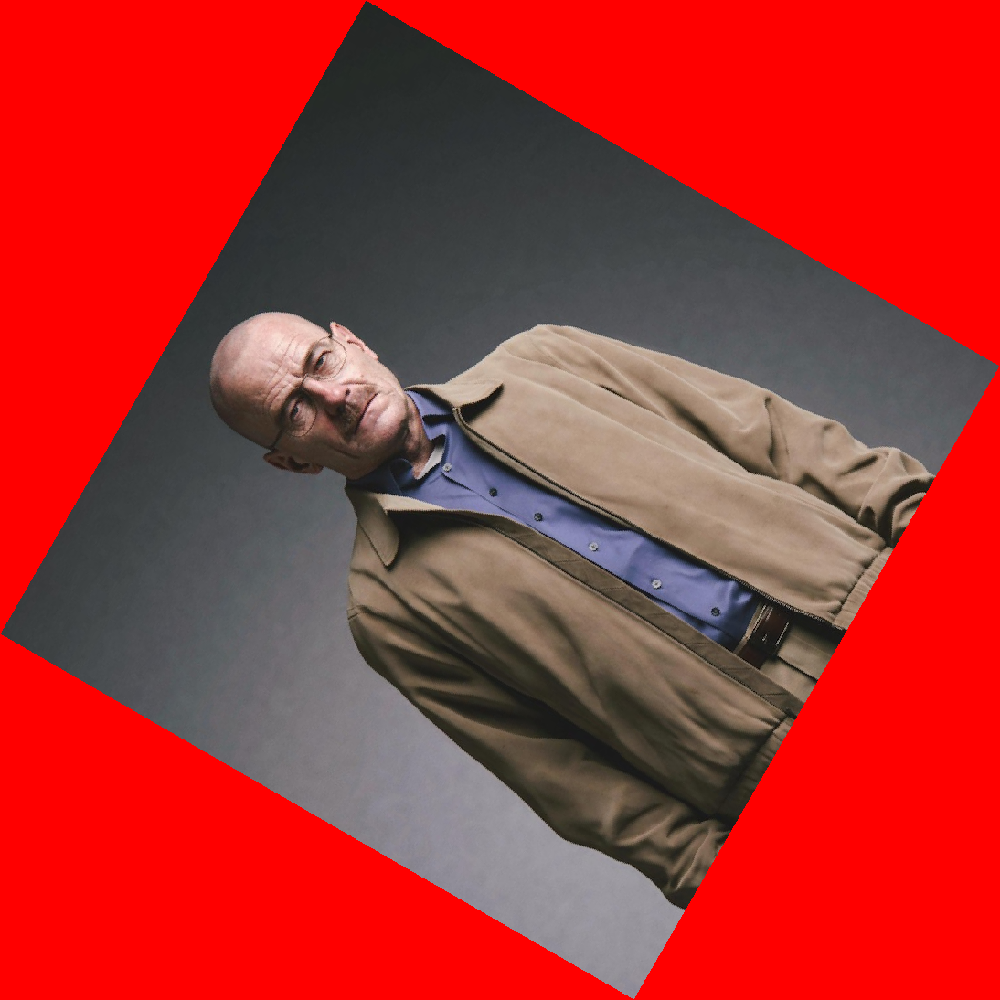

In [117]:
obrot_l = im.rotate(60, expand=True, fillcolor='red')
obrot_l

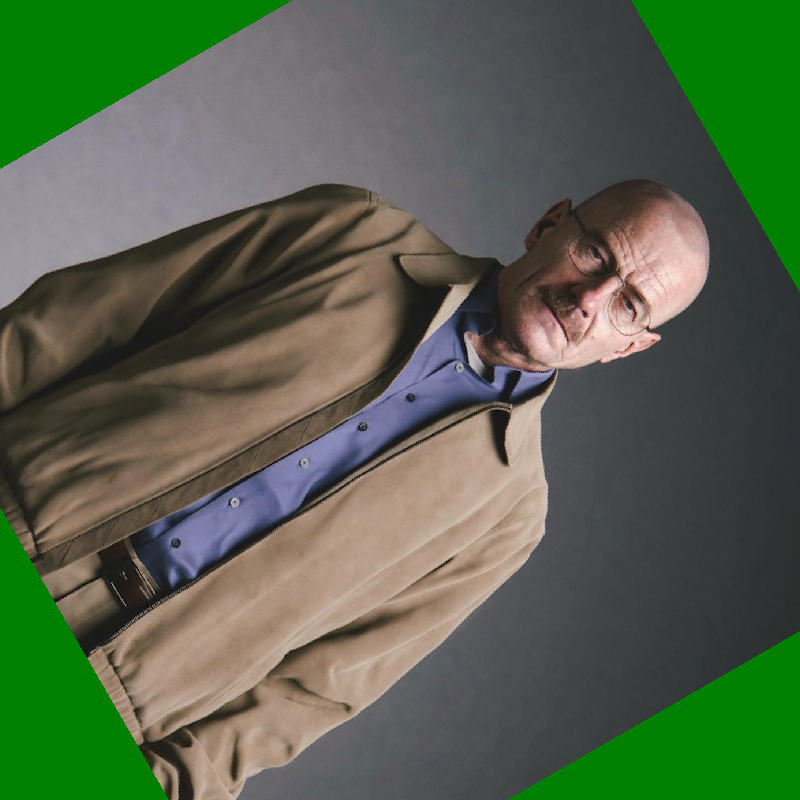

In [118]:
obrot_p = im.rotate(-60, expand=False, fillcolor='green')
obrot_p

4. Parametr expand nie działa dobrze, gdy center nie jest środkiem obrazu. Zaproponuj rozwiązanie, które pozwoli dokonać obrotu obrazu wokół punktu (0,0) tak, żeby widoczny był cały obraz. Wynik zapisz jako obraz obrot.png Wskazówka: stworzyć nowy obraz o wymiarach takich, żeby punkt obrotu był jego środkiem.

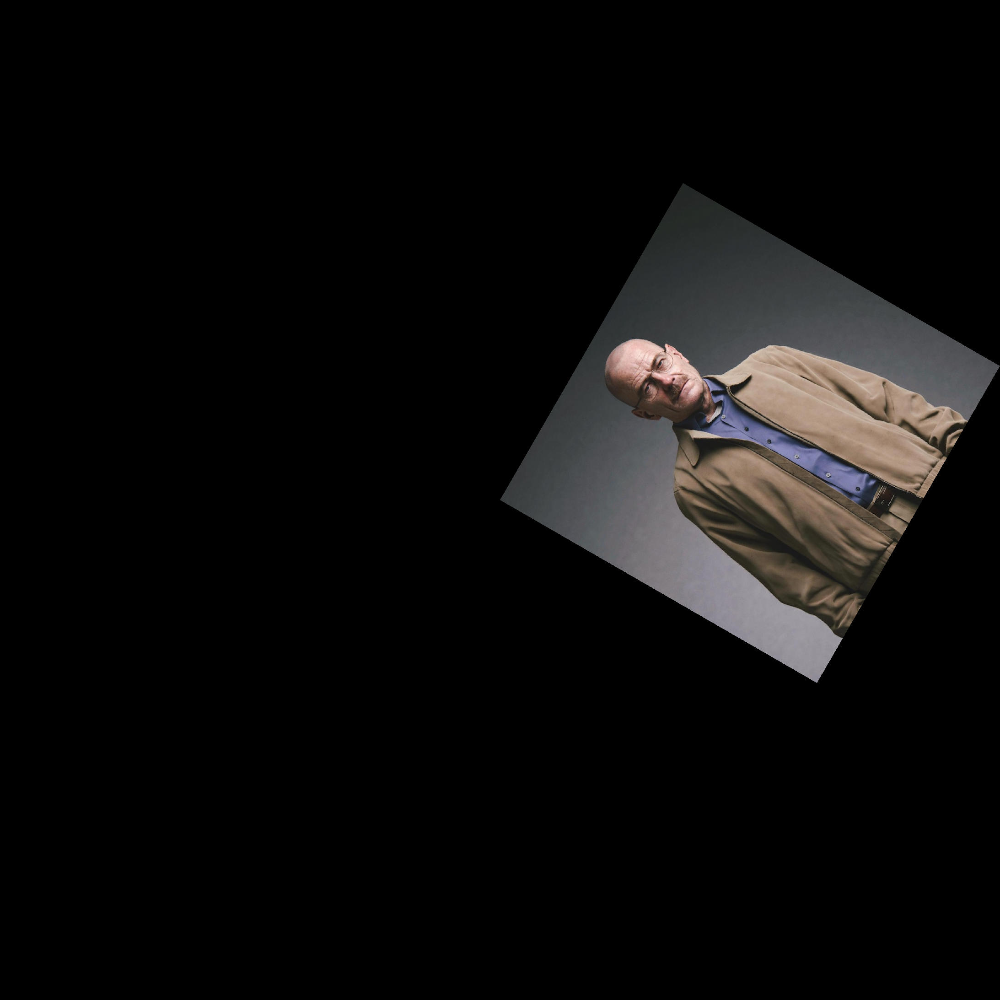

In [119]:
def obrot_wokol_0_0(obraz, kat):
    w, h = obraz.size
    new_im = Image.new(obraz.mode, (w*2, h*2), (0, 0, 0, 0)
                       if obraz.mode == 'RGBA' else (0, 0, 0))
    new_im.paste(obraz, (w, h))
    return new_im.rotate(kat, expand=True)


obrot_wokol_0_0(im, 60)

5.  Czy przekształcenia Image.TRANSPOSE i Image.TRANSVERSE można otrzymać wykonując obroty i Image.FLIP_LEFT_RIGHT? Jeśli tak, napisz jak to zrobić

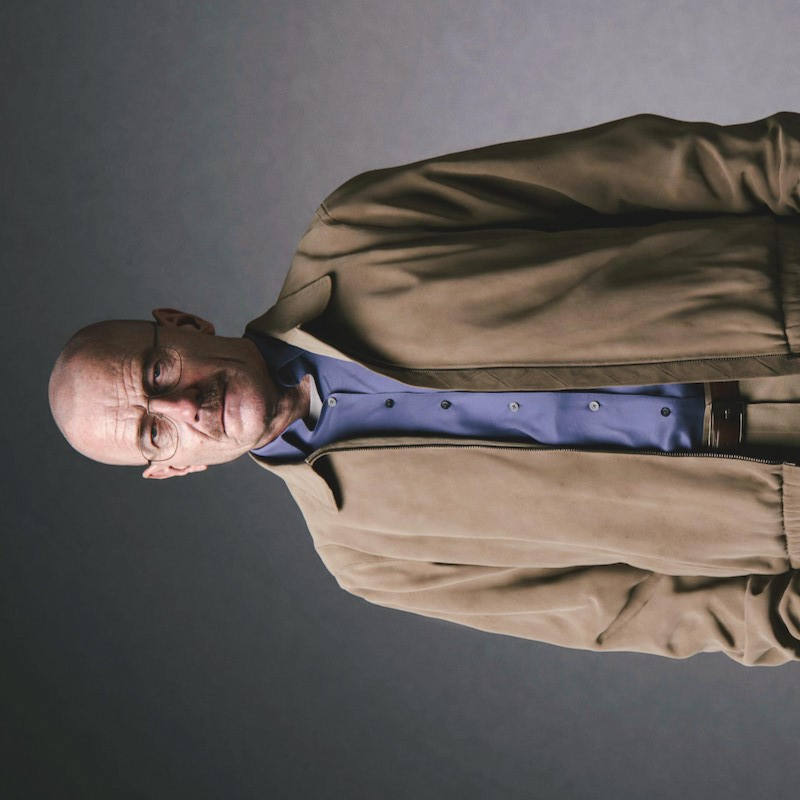

In [122]:
def manual_transpose(img):
    # TRANSPOSE: Odbicie względem głównej przekątnej. Zamiana osi X i Y
    # Można to uzyskać obracając o 90 stopni w prawo i odbijając w poziomie
    return img.rotate(-90).transpose(0)  # 0 = FLIP_LEFT_RIGHT
    # return img.transpose(5) # 5 = TRANSPOSE


manual_transpose(im)

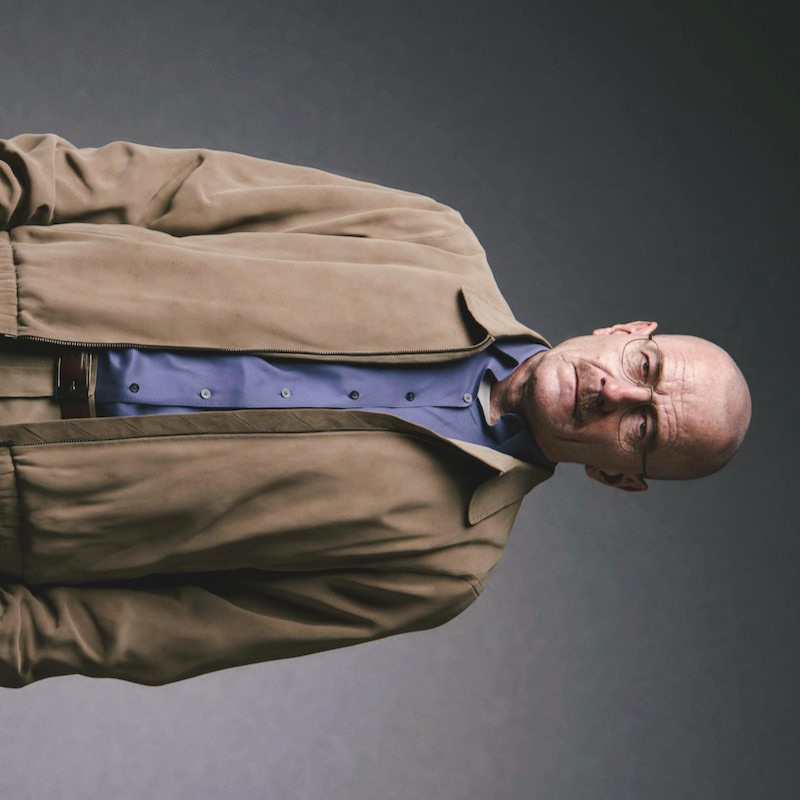

In [123]:
def manual_transverse(img):
    # TRANSVERSE: Odbicie względem drugiej przekątnej
    # Można to uzyskać obracając o 90 stopni w lewo i odbijając w poziomie
    return img.rotate(90).transpose(0)  # 0 = FLIP_LEFT_RIGHT
    # return img.transpose(6) # 6 = TRANSVERSE


manual_transverse(im)

Oba przekształcenia można uzyskać za pomocą obrotu i odbicia lustrzanego: \
Image.TRANSPOSE (odbicie względem głównej przekątnej, zamiana x na y): Wykonaj obrót o 270 stopni w lewo (lub 90 w prawo) i Image.FLIP_LEFT_RIGHT.\
Image.TRANSVERSE (odbicie względem drugiej bocznej): Wykonaj obrót o 90 stopni w lewo i Image.FLIP_LEFT_RIGHT.

6. Z obrazu motylek.png utwórz maskę o takich wymiarach, by na wybranym obrazie postac estetycznie wkleić trzy motylki (w normalnym położeniu, obrócony o 60 stopni w prawo, obrócony o 60 stopni w lewo). Skorzystaj z wklejania z maską obrazu kolorowe_tlo.png w obraz postac. Uwaga: można korzystać z resize, rotate i convert.

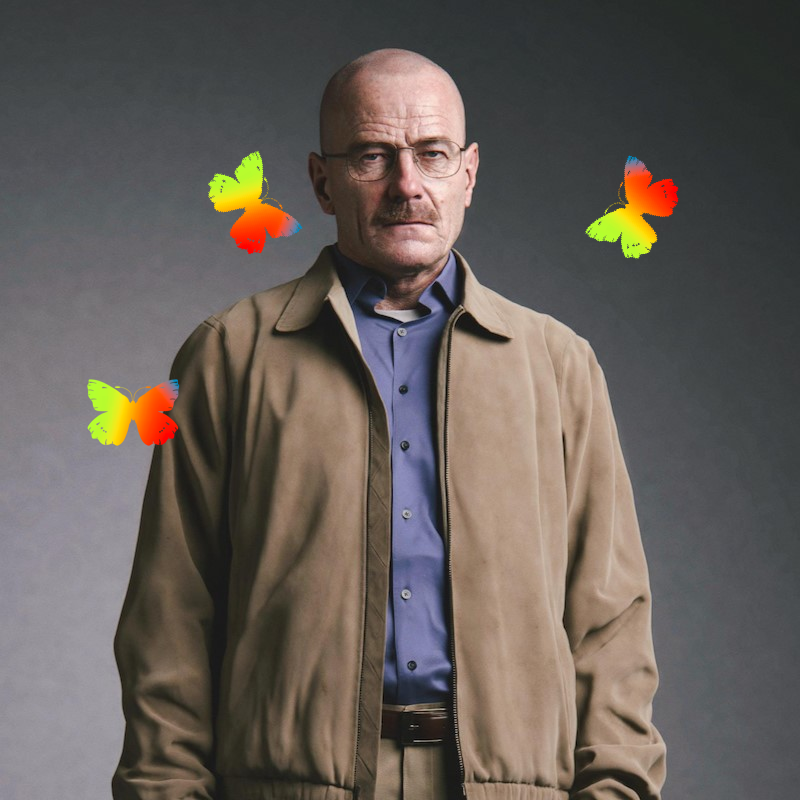

In [121]:
def create_custom_mask(source_path, threshold):
    m_img = Image.open(source_path)
    r_chan = m_img.split()[0]
    mask = r_chan.point(lambda x: 255 if x < threshold else 0)
    for _ in range(2):
        mask = mask.filter(ImageFilter.MaxFilter(3))
    for _ in range(2):
        mask = mask.filter(ImageFilter.MinFilter(3))
    return mask


motylek_mask = create_custom_mask('motylek.png', 255)
tlo = Image.open('kolorowe_tlo.png').resize((120, 120))
postac_final = im.copy()
motylki_cfg = [(0, (70, 350)), (-60, (170, 120)), (60, (550, 130))]

for angle, pos in motylki_cfg:
    m = motylek_mask.resize((120, 120)).rotate(angle, expand=True, fillcolor=0)
    t = tlo.rotate(angle, expand=True, fillcolor=0)
    postac_final.paste(t, pos, m)

postac_final